# SCP815_00_SIMBA_SlideSeq

>
>  Because of a lack of corresponding H&E image, such annotations are approximate and cannot be used as ground truth to evaluate spatial clustering performance. - SpatialPCA paper (Shang and Zhou 2022)

In [1]:
%load_ext autoreload
%autoreload 2

In [43]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from src.plot import plot_spatial, palette_celltype
import numpy as np
import pandas as pd
import copy
import squidpy as sq

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [5]:
import os
import simba as si
si.__version__

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/Users/cchu/opt/anaconda3/envs/env_si

'1.2'

In [8]:
workdir = 'data/SCP815/00'
si.settings.set_workdir(workdir)

Saving results in: data/SCP815/00


In [7]:
si.settings.set_figure_params(
    dpi=80,
    style='white',
    fig_size=[5,5],
    rc={'image.cmap': 'viridis'}
)
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')

# SlideSeq Squidpy tutorial

https://singlecell.broadinstitute.org/single_cell/study/SCP815/highly-sensitive-spatial-transcriptomics-at-near-cellular-resolution-with-slide-seqv2#study-download

> We obtained the Slide-seq V2 data2 from https://singlecell.broadinstitute.org/single_cell/study/ SCP815/sensitive-spatial-genome-wide-expression-profiling-at-cellularresolution#study-summary. We used the file “Puck_200115_08”, which contains 23,264 genes measured on 53,208 spatial locations. We retained genes with non-zero expression level on at least 20 locations and locations with non-zero expression for at least 20 genes. These filtering steps lead to a final set of 16,235 genes on 51,398 locations for analysis. - Shang and Zhou 2022

From squipy tutorial: https://squidpy.readthedocs.io/en/stable/notebooks/tutorials/tutorial_slideseqv2.html


In [52]:
# load the pre-processed dataset
adata = sq.datasets.slideseqv2()
adata

100%|████████████████████████████████████████████████████████████| 251M/251M [01:52<00:00, 2.34MB/s]


AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'barcode', 'x', 'y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster'
    var: 'MT', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'deconvolution_results', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


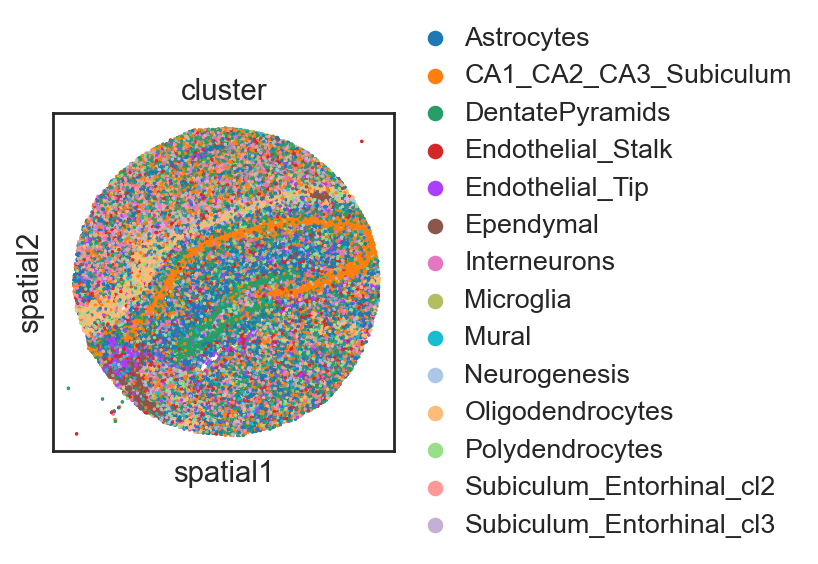

In [53]:
sq.pl.spatial_scatter(adata, color="cluster", size=1, shape=None)

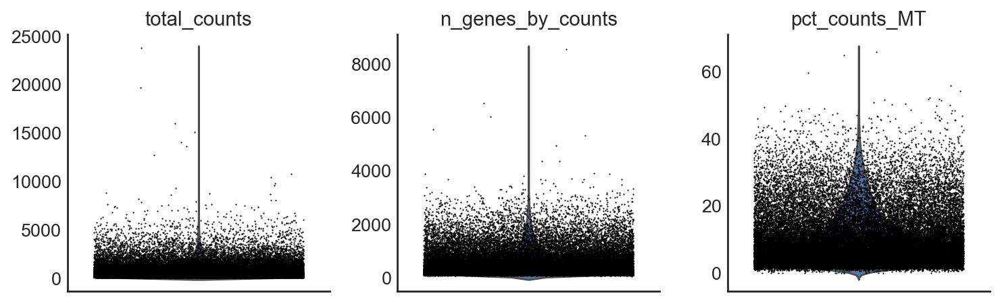

In [185]:
si.pl.violin(adata,list_obs=['total_counts','n_genes_by_counts','pct_counts_MT'])

In [96]:
cluster_counts_df = adata.obs.cluster.value_counts()
cluster_palette = {label: adata.uns['cluster_colors'][i] for i, label in enumerate(adata.obs.cluster.cat.categories)}
cluster_palette

{'Astrocytes': '#1f77b4',
 'CA1_CA2_CA3_Subiculum': '#ff7f0e',
 'DentatePyramids': '#279e68',
 'Endothelial_Stalk': '#d62728',
 'Endothelial_Tip': '#aa40fc',
 'Ependymal': '#8c564b',
 'Interneurons': '#e377c2',
 'Microglia': '#b5bd61',
 'Mural': '#17becf',
 'Neurogenesis': '#aec7e8',
 'Oligodendrocytes': '#ffbb78',
 'Polydendrocytes': '#98df8a',
 'Subiculum_Entorhinal_cl2': '#ff9896',
 'Subiculum_Entorhinal_cl3': '#c5b0d5'}

/var/folders/h3/49kgmgs54yv7pd7wbst2wfv80000gp/T/ipykernel_40505/382293702.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(adata.obs.cluster.value_counts(), palette=cluster_palette)


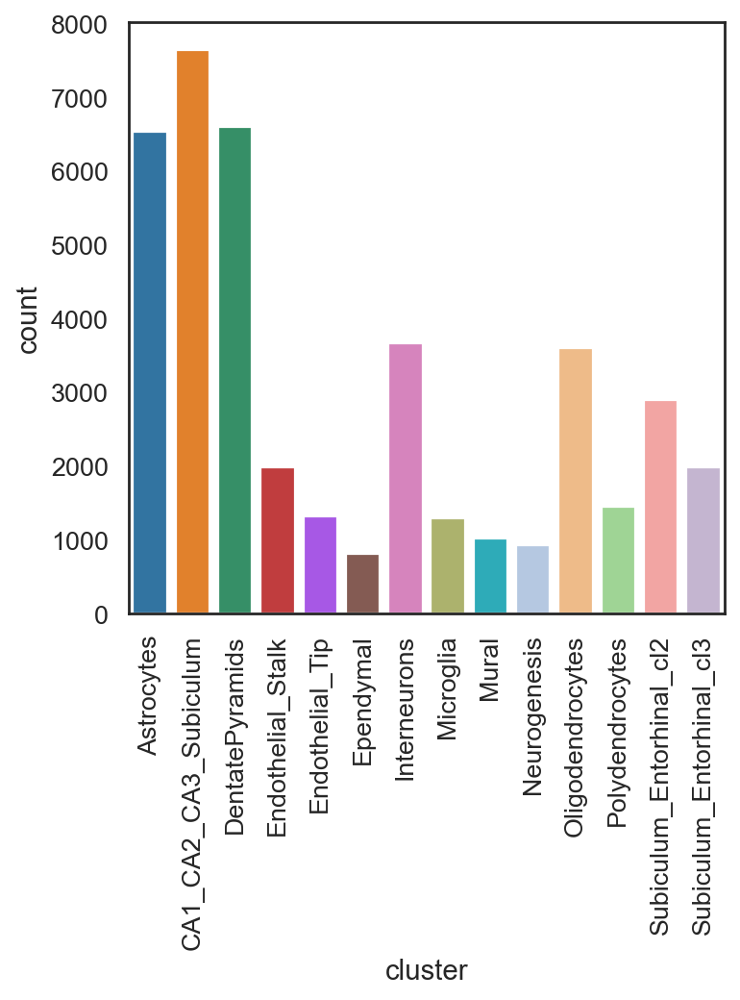

In [97]:
sns.barplot(adata.obs.cluster.value_counts(), palette=cluster_palette)
plt.xticks(rotation=90)
plt.show()

## Raw UMAP

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


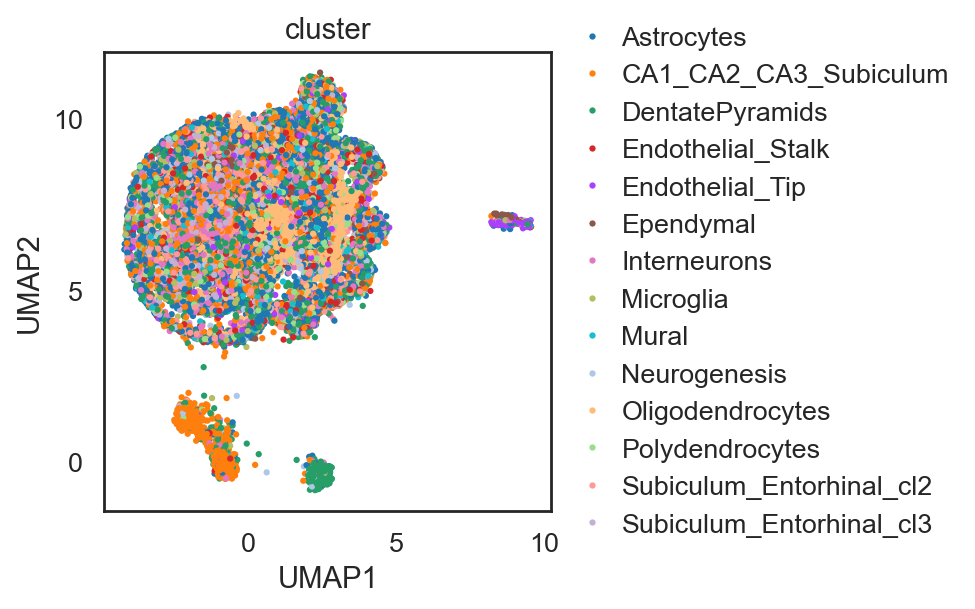

In [170]:
si.tl.umap(adata,n_neighbors=15,n_components=2)
si.pl.umap(
    adata,color=['cluster'],
    dict_palette={'cluster': cluster_palette},
    fig_size=(6,4),
    drawing_order='random'
)

## Raw PCA

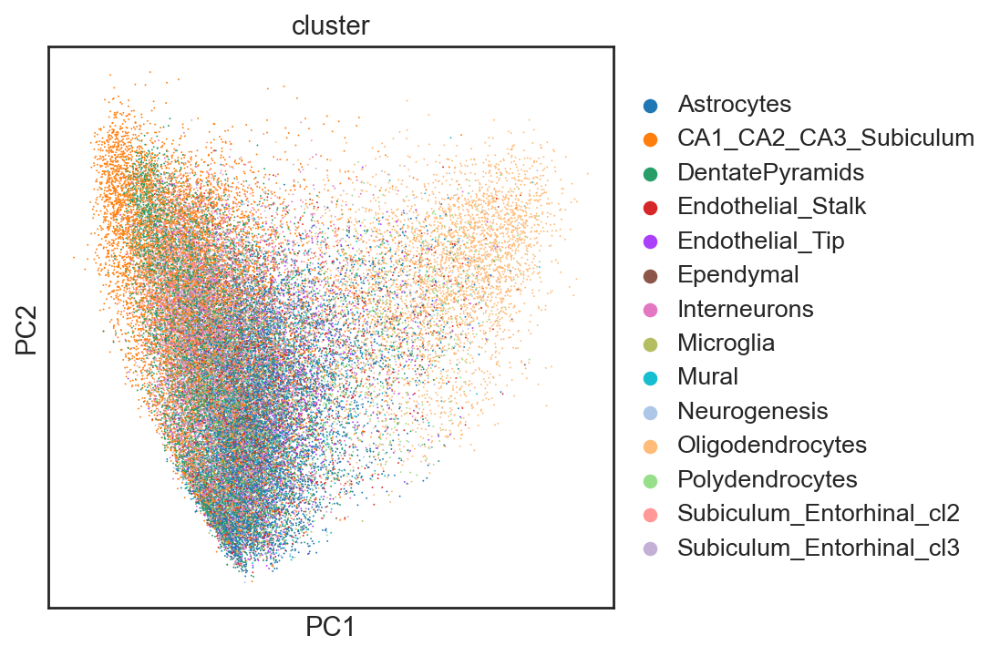

In [186]:
sc.pl.pca(adata, color=['cluster'], palette=cluster_palette)

## Neighborhood enrichment

  0%|                                                                        | 0/1000 [00:00<?, ?/s]/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/numba/core/decorators.py:246: RuntimeWarning: nopython is set for njit and is ignored
  warnings.warn('nopython is set for njit and is ignored', RuntimeWarning)
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
100%|█████████████████████████████████████████████████████████

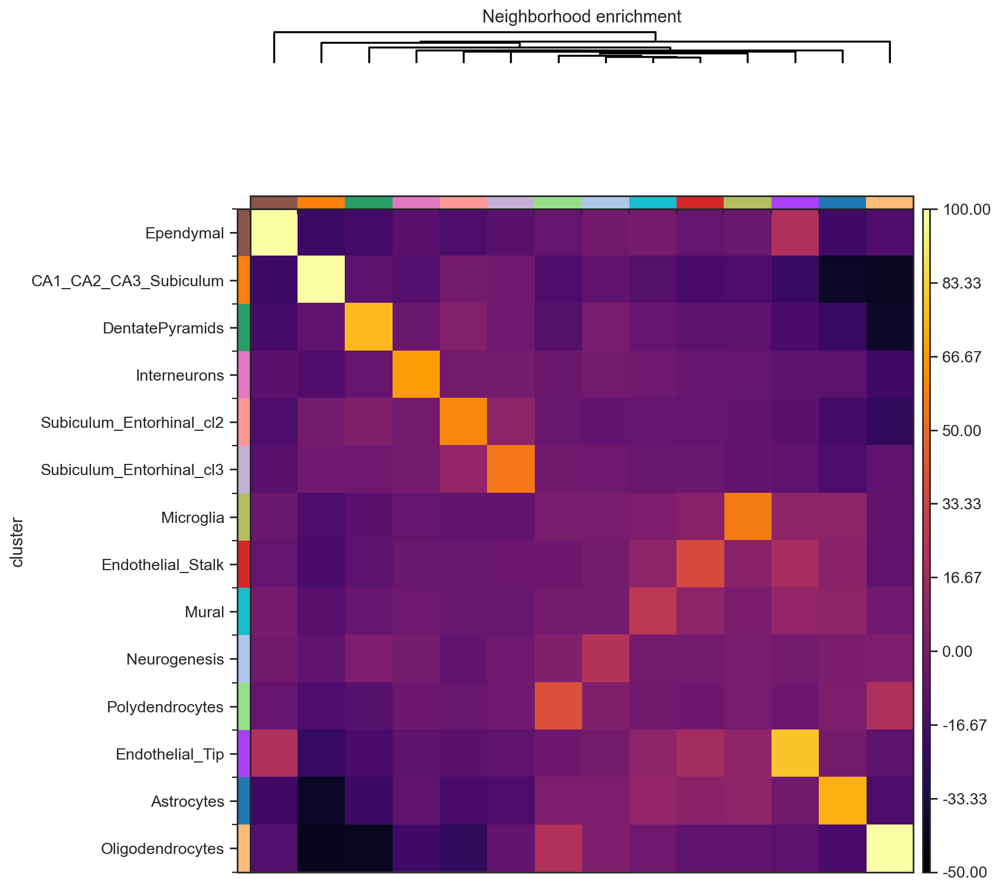

In [69]:
sq.gr.spatial_neighbors(adata, coord_type="generic")
sq.gr.nhood_enrichment(adata, cluster_key="cluster")
sq.pl.nhood_enrichment(
    adata, cluster_key="cluster", method="single", cmap="inferno", vmin=-50, vmax=100
)

## Ripley Statistics

Degree of dispersion

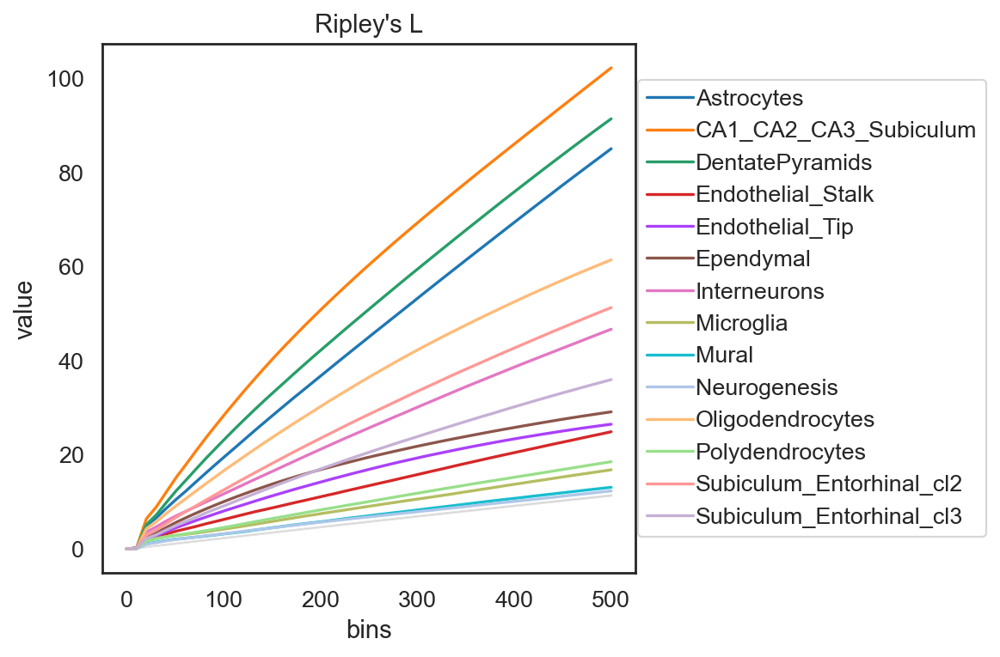

In [100]:
mode = "L"
sq.gr.ripley(adata, cluster_key="cluster", mode=mode, max_dist=500)
sq.pl.ripley(adata, cluster_key="cluster", mode=mode)

## Spatially variable genes

In [101]:
sq.gr.spatial_autocorr(adata, mode="moran")
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
Ttr,0.705846,0.0,0.000007,0.0
Plp1,0.531659,0.0,0.000007,0.0
Hpca,0.493652,0.0,0.000007,0.0
Mbp,0.488613,0.0,0.000007,0.0
Enpp2,0.458899,0.0,0.000007,0.0
1500015O10Rik,0.458650,0.0,0.000007,0.0
Pcp4,0.429474,0.0,0.000007,0.0
Sst,0.406900,0.0,0.000007,0.0
Ptgds,0.387598,0.0,0.000007,0.0
Nrgn,0.370682,0.0,0.000007,0.0


In [119]:
moransI_df = adata.uns["moranI"].copy()
moransI_df['-log(pval_norm)'] = -np.log(moransI_df['pval_norm'])

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='I', ylabel='-log(pval_norm)'>

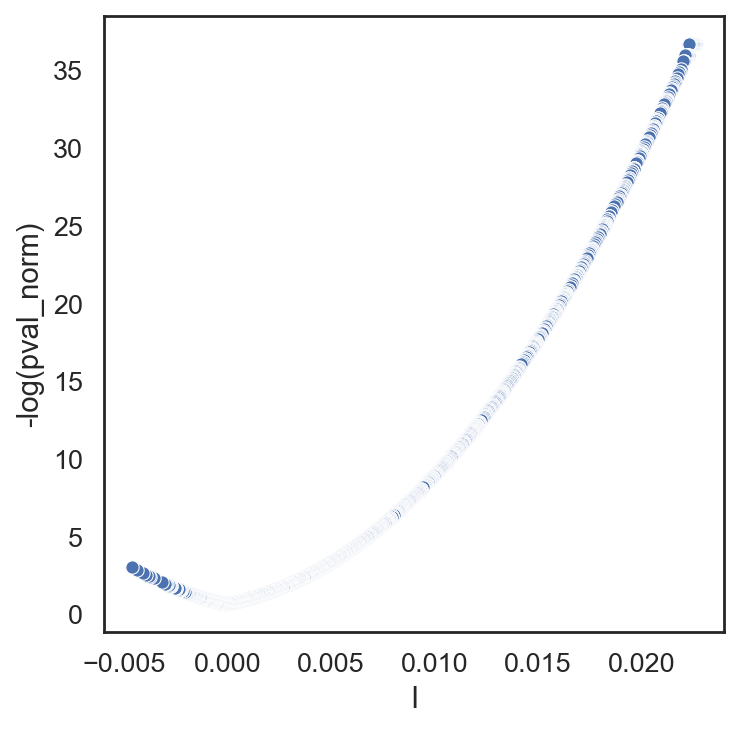

In [121]:
sns.scatterplot(moransI_df, x='I', y='-log(pval_norm)')

<Axes: >

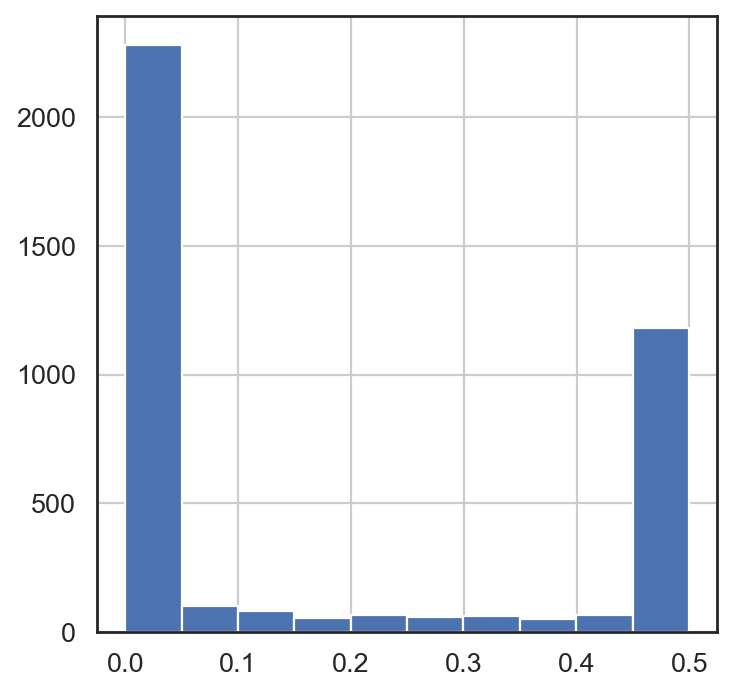

In [123]:
moransI_df['pval_norm_fdr_bh'].hist()

<Axes: >

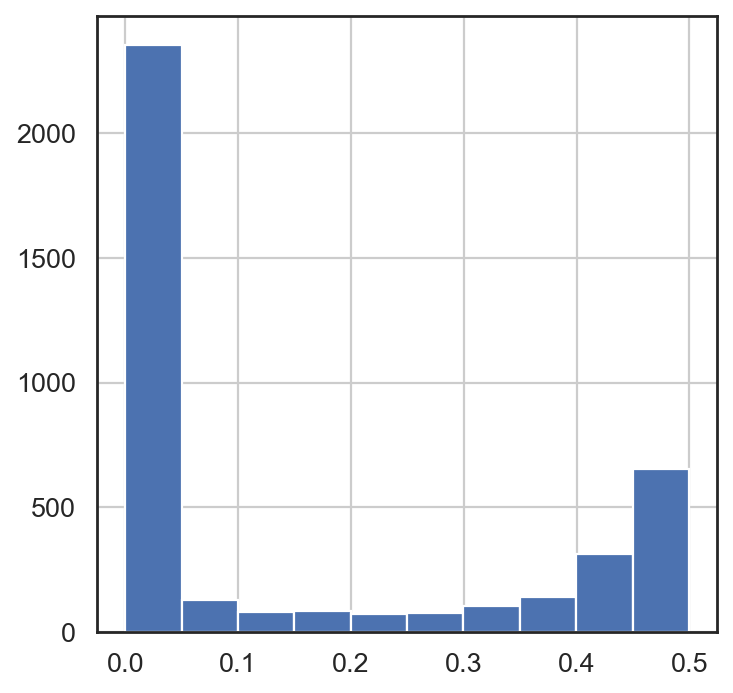

In [149]:
moransI_df['pval_norm'].hist()

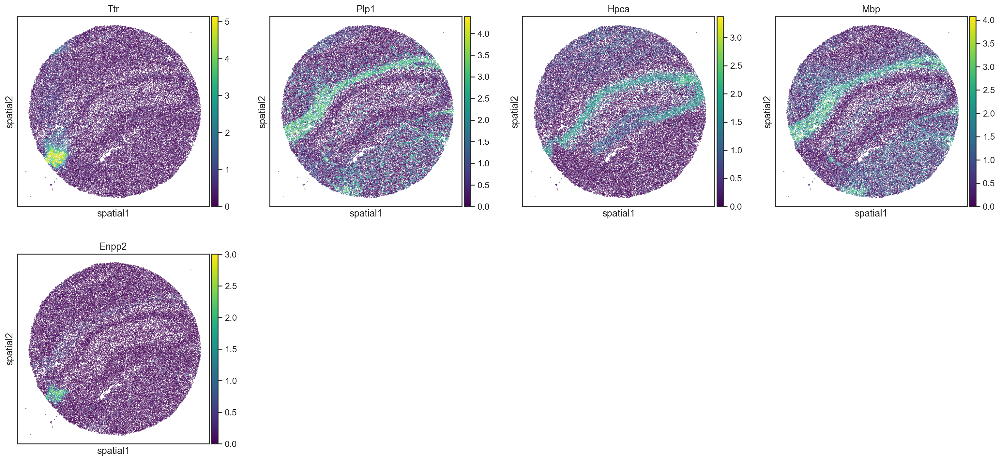

In [102]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color=adata.uns["moranI"].head(5).index.tolist(),
    size=0.1,
)

# SIMBA

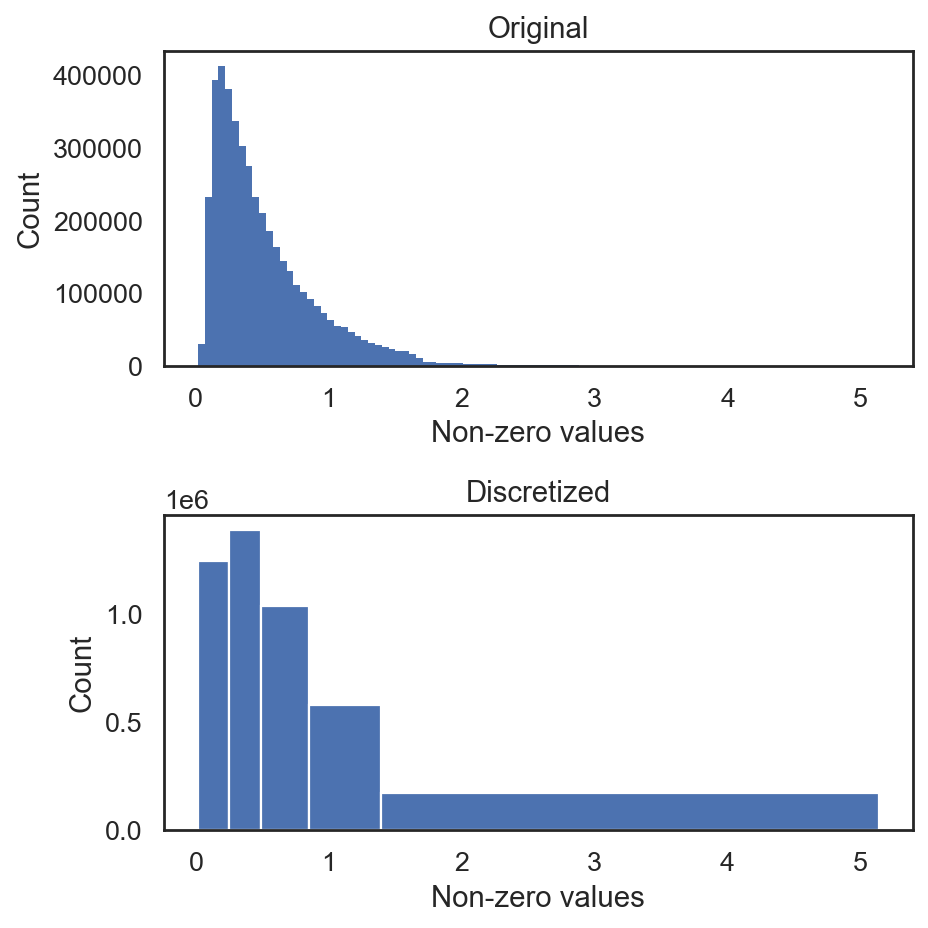

In [63]:
si.tl.discretize(adata,n_bins=5)
si.pl.discretize(adata,kde=False)

In [65]:
adata.layers

Layers with keys: simba

In [66]:
si.tl.gen_graph(
    list_CG=[adata],
    layer='simba',
    use_highly_variable=False, 
    dirname='graph0'
)

relation0: source: C, destination: G
#edges: 1241239
relation1: source: C, destination: G
#edges: 1386032
relation2: source: C, destination: G
#edges: 1033959
relation3: source: C, destination: G
#edges: 578710
relation4: source: C, destination: G
#edges: 170493
Total number of edges: 4410433
Writing graph file "pbg_graph.txt" to "data/SCP815/00/pbg/graph0" ...
Finished.


In [67]:
si.tl.pbg_train(auto_wd=True, save_wd=True, output='model')

Auto-estimating weight decay ...
`.settings.pbg_params['wd']` has been updated to 0.008034
Weight decay being used for training is 0.008034
Converting input data ...
[2025-01-21 13:06:38.253605] Using the 5 relation types given in the config
[2025-01-21 13:06:38.255873] Searching for the entities in the edge files...
[2025-01-21 13:06:43.657848] Entity type C:
[2025-01-21 13:06:43.658897] - Found 41786 entities
[2025-01-21 13:06:43.659588] - Removing the ones with fewer than 1 occurrences...
[2025-01-21 13:06:43.667915] - Left with 41786 entities
[2025-01-21 13:06:43.670085] - Shuffling them...
[2025-01-21 13:06:43.704804] Entity type G:
[2025-01-21 13:06:43.705754] - Found 4000 entities
[2025-01-21 13:06:43.706350] - Removing the ones with fewer than 1 occurrences...
[2025-01-21 13:06:43.708207] - Left with 4000 entities
[2025-01-21 13:06:43.710160] - Shuffling them...
[2025-01-21 13:06:43.714240] Preparing counts and dictionaries for entities and relation types:
[2025-01-21 13:06:43.

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/torchbiggraph/tensorlist.py:86: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if data.numel() == 0 and data.storage().size() == 0:


[2025-01-21 13:07:02.101246] - Processed 4410433 edges in total
Starting training ...


/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/torchbiggraph/tensorlist.py:86: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if data.numel() == 0 and data.storage().size() == 0:
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/torchbiggraph/tensorlist.py:86: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if data.numel() == 0 and data.storage().size() == 0:
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/torchbiggraph/tensorlist.py:86: UserWarning: T

Finished


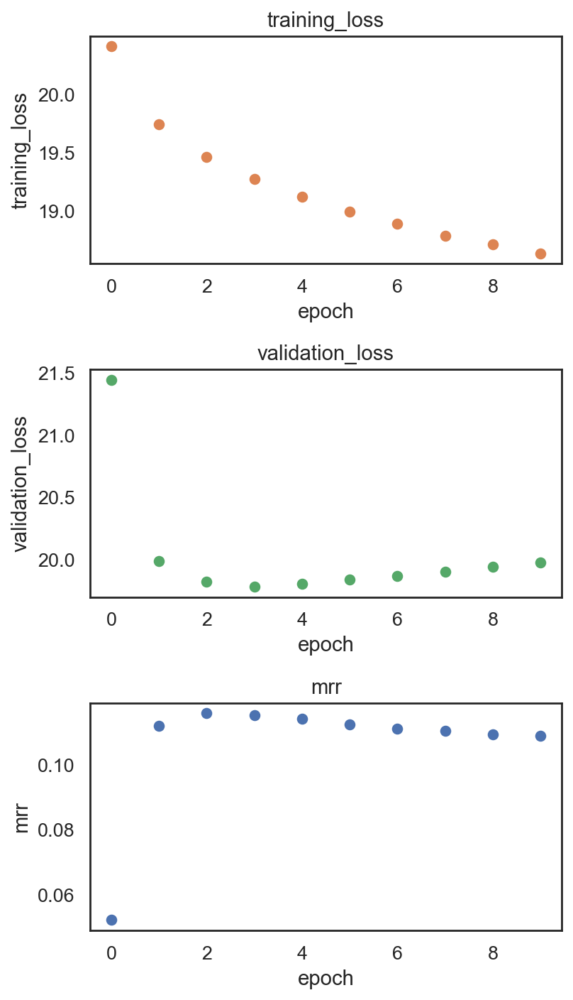

In [68]:
si.pl.pbg_metrics(fig_ncol=1)

## post training analysis

In [70]:
# read in entity embeddings obtained from pbg training.
dict_adata = si.read_embedding()
dict_adata

{'G': AnnData object with n_obs × n_vars = 4000 × 50,
 'C': AnnData object with n_obs × n_vars = 41786 × 50}

In [71]:
adata_C = dict_adata['C']  # embeddings of cells
adata_G = dict_adata['G']  # embeddings of genes

In [72]:
adata.obs

,barcode,x,y,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_MT,log1p_total_counts_MT,pct_counts_MT,n_counts,leiden,cluster,pbg_id
AACGTCATAATCGT,AACGTCATAATCGT,888.95,3219.5,6539,8.785692,23772.0,10.076305,16.902238,22.311964,29.559987,42.756184,958.0,6.865891,4.029951,23772.0,0,DentatePyramids,C.0
TACTTTAGCGCAGT,TACTTTAGCGCAGT,4762.20,5020.4,6017,8.702510,19661.0,9.886443,19.744672,24.698642,31.488734,44.428056,1579.0,7.365180,8.031128,19661.0,6,CA1_CA2_CA3_Subiculum,C.1
CATGCCTGGGTTCG,CATGCCTGGGTTCG,886.50,3199.6,5319,8.579229,15999.0,9.680344,16.463529,22.182636,29.776861,43.990249,707.0,6.562444,4.419026,15999.0,0,DentatePyramids,C.2
TCGATATGGCACAA,TCGATATGGCACAA,2237.10,5144.6,5554,8.622454,15069.0,9.620461,13.783264,19.092176,26.212755,40.467184,544.0,6.300786,3.610060,15069.0,6,DentatePyramids,C.3
TTATCTGACGAAGC,TTATCTGACGAAGC,1031.80,2425.2,4946,8.506537,14013.0,9.547812,16.984229,22.664669,30.207664,44.287447,681.0,6.525030,4.859773,14013.0,0,Subiculum_Entorhinal_cl2,C.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CACCCGATGACTCC,CACCCGATGACTCC,4314.40,1770.1,100,4.615121,120.0,4.795791,58.333333,100.000000,100.000000,100.000000,6.0,1.945910,5.000000,120.0,3,Polydendrocytes,C.41781
CTTGATTAGGCAGG,CTTGATTAGGCAGG,1452.50,3013.1,108,4.691348,127.0,4.852030,54.330709,93.700787,100.000000,100.000000,20.0,3.044523,15.748032,127.0,1,Interneurons,C.41782
GAGTTCCTAAGCGG,GAGTTCCTAAGCGG,3090.10,2045.0,103,4.644391,114.0,4.744932,53.508772,97.368421,100.000000,100.000000,6.0,1.945910,5.263158,114.0,1,DentatePyramids,C.41783
GCGCTCAGTGCTCT,GCGCTCAGTGCTCT,3304.10,3491.5,112,4.727388,115.0,4.753590,46.086957,89.565217,100.000000,100.000000,4.0,1.609438,3.478261,115.0,7,Interneurons,C.41784


In [74]:
adata_C.obs['cluster'] = adata[adata_C.obs_names,:].obs['cluster'].copy()
adata_C.obs['n_counts'] = adata[adata_C.obs_names,:].obs['n_counts'].copy()
adata_C.obs['n_genes_by_counts'] = adata[adata_C.obs_names,:].obs['n_genes_by_counts'].copy()
adata_C

AnnData object with n_obs × n_vars = 41786 × 50
    obs: 'cluster', 'n_counts', 'n_genes_by_counts'

In [76]:
si.tl.umap(adata_C,n_neighbors=15,n_components=2)

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


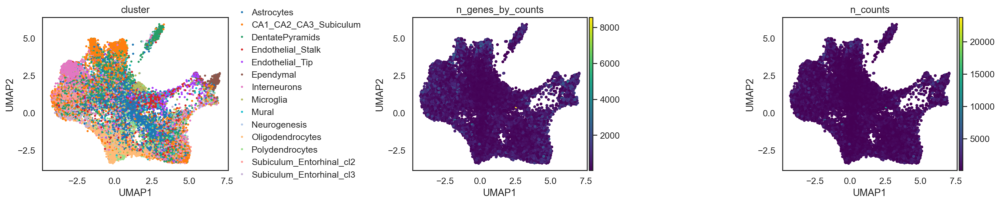

In [98]:
si.pl.umap(
    adata_C,color=['cluster', 'n_genes_by_counts', 'n_counts'],
    dict_palette={'cluster': cluster_palette},
    fig_size=(6,4),
    drawing_order='random'
)

In [80]:
si.preprocessing.pca(adata_C)

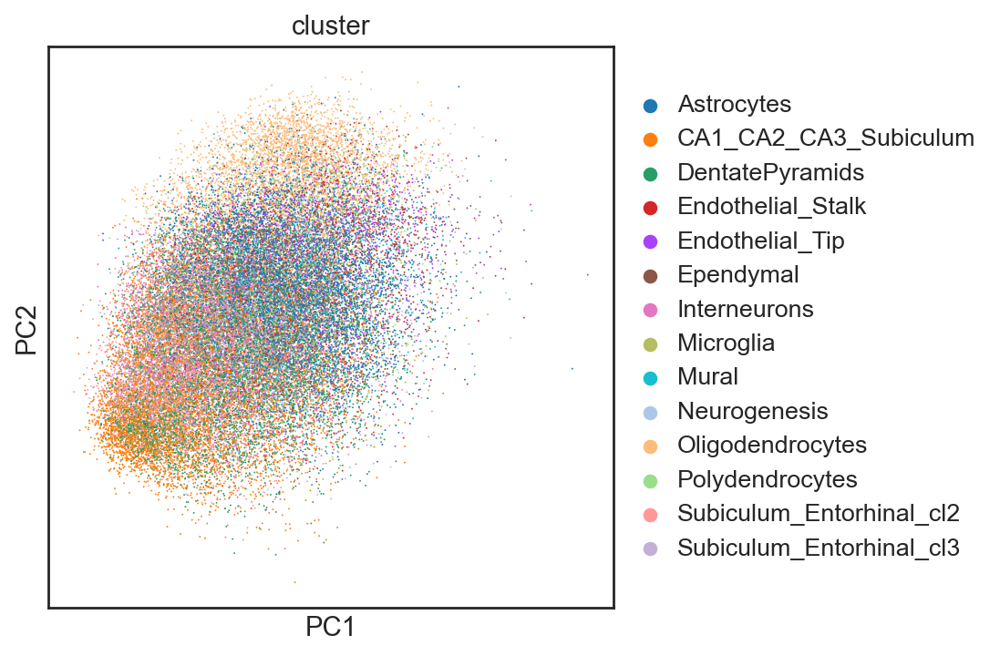

In [99]:
sc.pl.pca(adata_C, color=['cluster'], palette=cluster_palette, dimensions=(0, 1))

## Embeddings

In [103]:
# embed cells and genes into the same space
adata_all = si.tl.embed(adata_ref=adata_C,list_adata_query=[adata_G])
adata_all.obs.head()

Performing softmax transformation for query data 0;


,cluster,n_counts,n_genes_by_counts,id_dataset
CCGACTTATCGGGC,CA1_CA2_CA3_Subiculum,1426.0,1078.0,ref
TGCTAAACGTAGGT,Interneurons,1837.0,1197.0,ref
CAACCACTCGCTGG,Subiculum_Entorhinal_cl2,372.0,311.0,ref
AGGACTAAAGGGCC,Subiculum_Entorhinal_cl3,163.0,151.0,ref
GCACAACTCCACTA,Subiculum_Entorhinal_cl3,438.0,338.0,ref


In [105]:
## add annotations of cells and genes
adata_all.obs['entity_anno'] = ""
adata_all.obs.loc[adata_C.obs_names, 'entity_anno'] = adata_all.obs.loc[adata_C.obs_names, 'cluster']
adata_all.obs.loc[adata_G.obs_names, 'entity_anno'] = 'gene'
adata_all.obs.head()

,cluster,n_counts,n_genes_by_counts,id_dataset,entity_anno
CCGACTTATCGGGC,CA1_CA2_CA3_Subiculum,1426.0,1078.0,ref,CA1_CA2_CA3_Subiculum
TGCTAAACGTAGGT,Interneurons,1837.0,1197.0,ref,Interneurons
CAACCACTCGCTGG,Subiculum_Entorhinal_cl2,372.0,311.0,ref,Subiculum_Entorhinal_cl2
AGGACTAAAGGGCC,Subiculum_Entorhinal_cl3,163.0,151.0,ref,Subiculum_Entorhinal_cl3
GCACAACTCCACTA,Subiculum_Entorhinal_cl3,438.0,338.0,ref,Subiculum_Entorhinal_cl3


In [106]:
cluster_palette_entity_anno = cluster_palette.copy()
cluster_palette_entity_anno['gene'] = "lightgray"

### All genes

In [108]:
si.tl.umap(adata_all,n_neighbors=15,n_components=2)

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/simba/plotting/_plot.py:1065: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['color'] = dict()


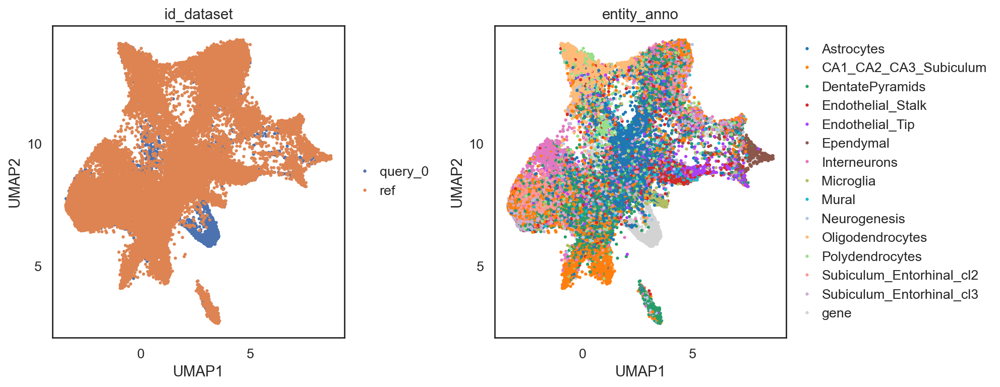

In [109]:
si.pl.umap(adata_all[::-1,],color=['id_dataset','entity_anno'],
           dict_palette={'entity_anno': cluster_palette_entity_anno},
           drawing_order='original',
           fig_size=(6,5))

## Highly variable genes

In [114]:
adata.layers['counts'] = adata.X.copy()

In [116]:
si.pp.select_variable_genes(adata,layer='counts', n_top_genes=3000)
var_genes = adata.var_names[adata.var['highly_variable']].tolist()

3000 variable genes are selected.


In [117]:
# obtain SIMBA embeddings of cells and variable genes
adata_all2 = adata_all[list(adata_C.obs_names) + var_genes,].copy()
# visualize them using UMAP
si.tl.umap(adata_all2,n_neighbors=15,n_components=2)

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


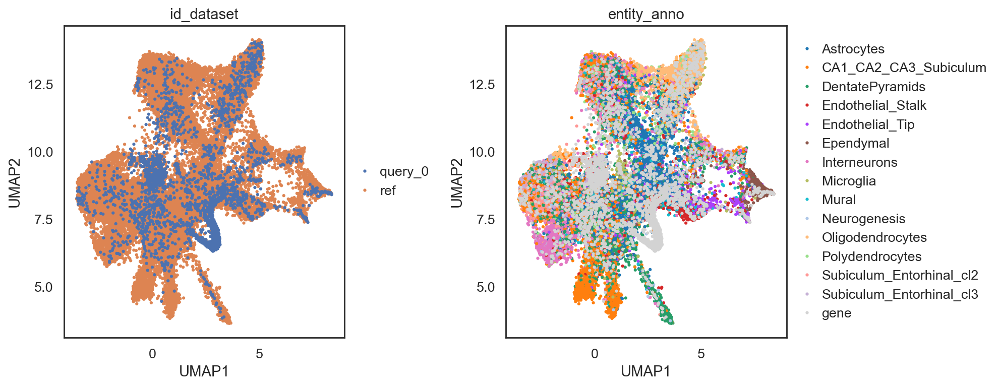

In [129]:
si.pl.umap(adata_all2, color=['id_dataset','entity_anno'],
           dict_palette={'entity_anno': cluster_palette_entity_anno},
           drawing_order='original',
           fig_size=(6,5))

## Spatially variable genes (Moran's I)

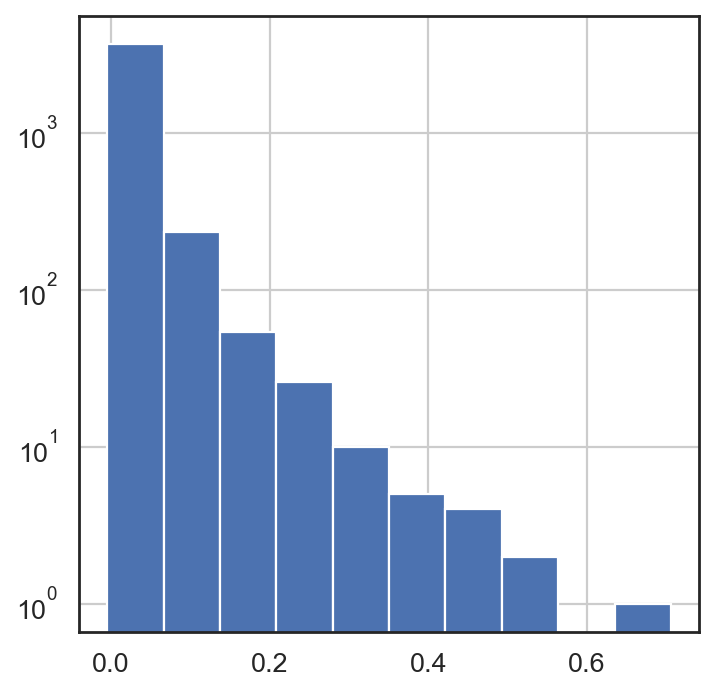

In [139]:
adata.uns["moranI"]["I"].hist()
plt.yscale('log')

In [136]:
# obtain SIMBA embeddings of cells and variable genes
adata_all_svg = adata_all[list(adata_C.obs_names) + adata.uns["moranI"].head(50).index.tolist(),].copy()
# visualize them using UMAP
si.tl.umap(adata_all_svg,n_neighbors=15,n_components=2)

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


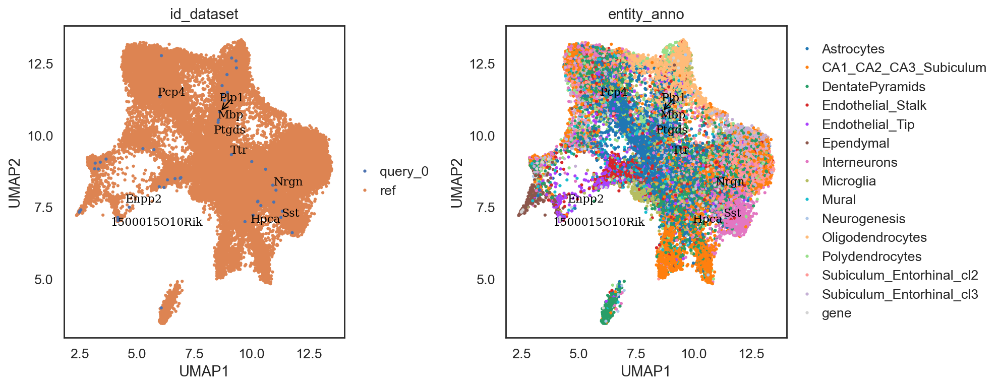

In [189]:
si.pl.umap(adata_all_svg, color=['id_dataset','entity_anno'],
           dict_palette={'entity_anno': cluster_palette_entity_anno},
           drawing_order='original',
           texts=adata.uns["moranI"].head(10).index.tolist(),
           show_texts=True,
           fig_size=(6,5))

## Compare entities

In [140]:
adata_cmp = si.tl.compare_entities(adata_ref=adata_C, adata_query=adata_G)
adata_cmp

AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'cluster', 'n_counts', 'n_genes_by_counts'
    var: 'max', 'std', 'gini', 'entropy'
    layers: 'norm', 'softmax'

/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/simba/plotting/_post_training.py:256: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt_texts = [plt.text(adata_cmp.var[x][i],
/Users/cchu/opt/anaconda3/envs/env_simba/lib/python3.11/site-packages/simba/plotting/_post_training.py:257: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata_cmp.var[y][i],


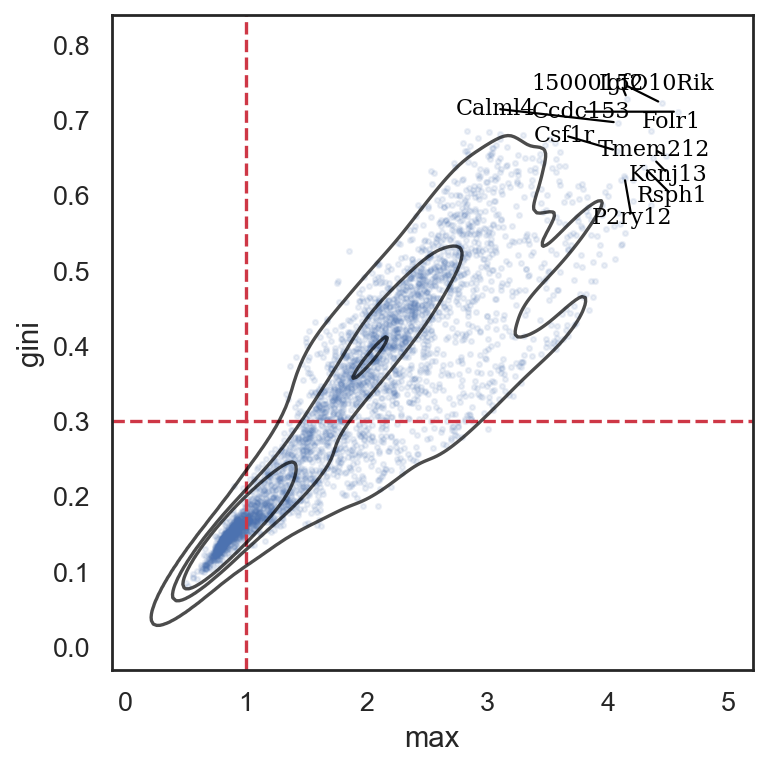

In [152]:
# SIMBA metrics can be visualized using the following function:
si.pl.entity_metrics(adata_cmp,
                     x='max',
                     y='gini',
                     show_contour=True,
                     show_texts=True,
                     show_cutoff=True,
                     size=5,
                     text_expand=(1.3,1.5),
                     cutoff_x=1.,
                     cutoff_y=0.3,
                     save_fig=False, alpha=0.1)

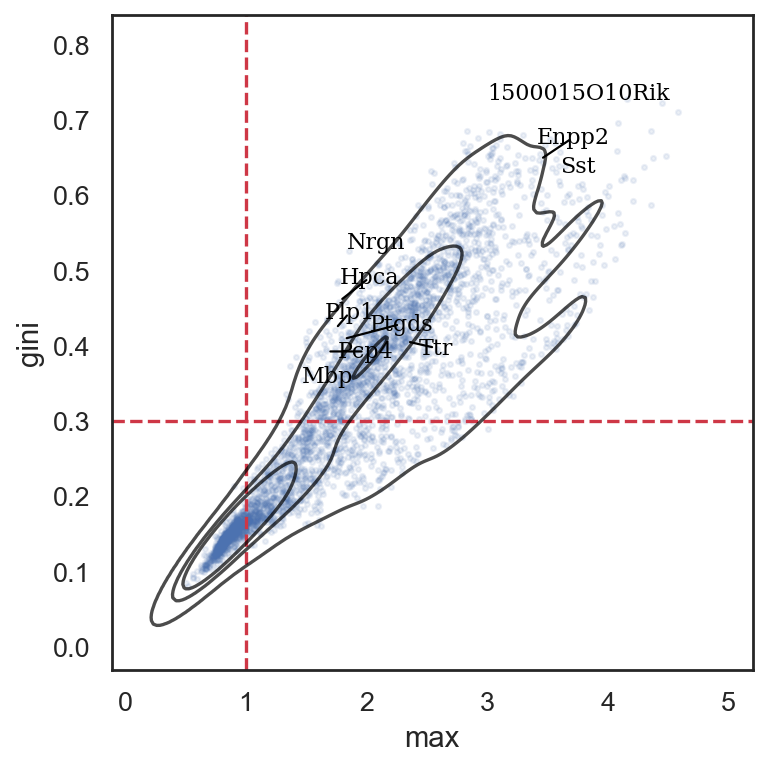

In [163]:
# SIMBA metrics can be visualized using the following function:
si.pl.entity_metrics(adata_cmp,
                     x='max',
                     y='gini',
                     show_contour=True,
                     texts=adata.uns["moranI"].head(10).index.tolist(),
                     show_texts=True,
                     show_cutoff=True,
                     size=5,
                     text_expand=(1.3,1.5),
                     cutoff_x=1.,
                     cutoff_y=0.3,
                     save_fig=False, alpha=0.1)

Two clusters?

In [144]:
sorted_genes_gini_df = adata_cmp.var.sort_values(by='gini', ascending=False)
sorted_genes_gini_df.head()


,max,std,gini,entropy
Igf2,4.161830,1.088610,0.727170,9.091785
1500015O10Rik,4.450053,0.934801,0.721732,8.844331
Ccdc153,4.583431,0.964555,0.710847,8.961655
Calml4,4.084612,0.936693,0.696357,9.139096
Prkcd,2.830061,1.219330,0.685765,9.670275


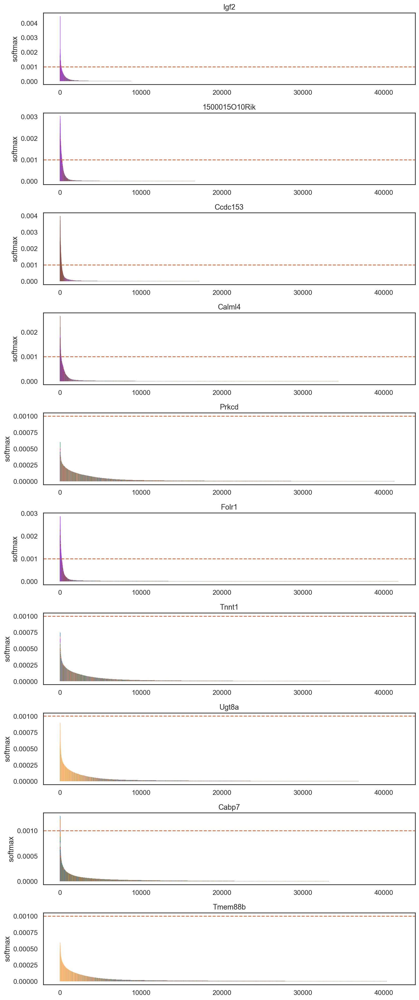

In [164]:
# add annotations of cells
adata_cmp.obs['cluster'] = adata.obs.loc[adata_cmp.obs_names,'cluster']
si.pl.entity_barcode(adata_cmp,
                     layer='softmax',
                     entities=sorted_genes_gini_df.head(10).index.tolist(),
                     anno_ref='cluster',
                     show_cutoff=True,
                     cutoff=0.001,
                     palette=cluster_palette,
                     fig_size=(10, 2.5),
                     save_fig=False)

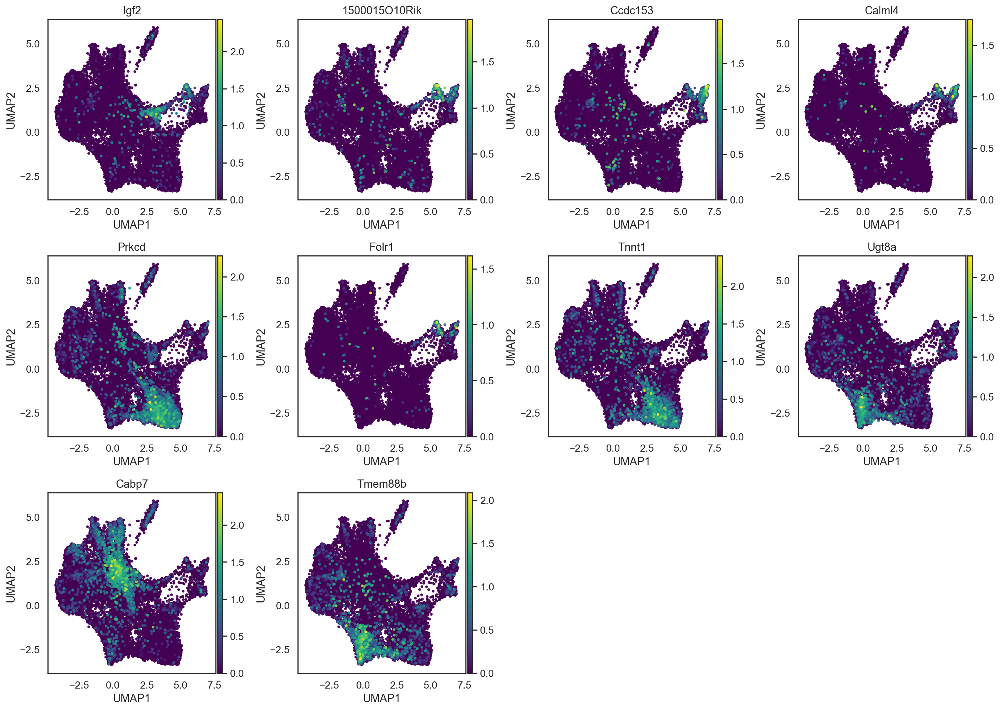

In [168]:
adata.obsm['X_umap'] = adata_C[adata.obs_names,].obsm['X_umap'].copy()
si.pl.umap(adata,
           color=sorted_genes_gini_df.head(10).index.tolist(),
           drawing_order='sorted',
           size=5,
           alpha=0.9,
           fig_ncol=4,
           fig_size=(4,4),
           save_fig=False)

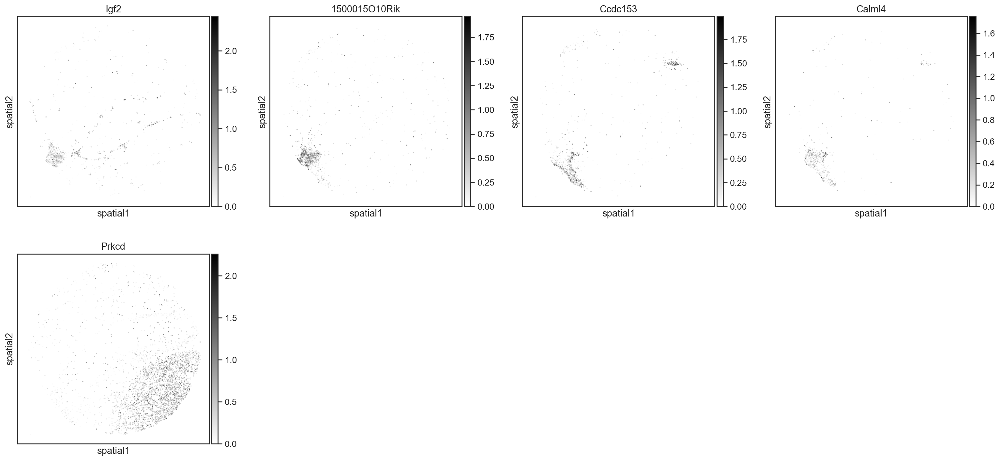

In [183]:
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color=sorted_genes_gini_df.head(5).index.tolist(),
    size=0.3, cmap='binary'
)

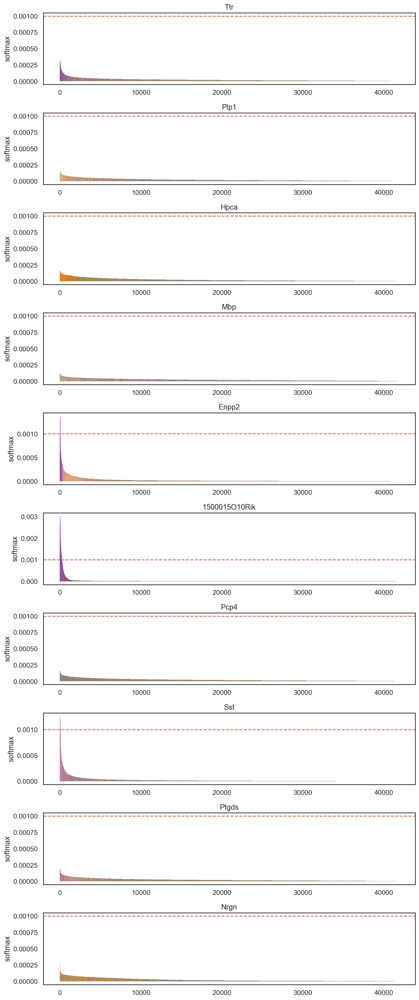

In [165]:
si.pl.entity_barcode(adata_cmp,
                     layer='softmax',
                     entities=adata.uns["moranI"].head(10).index.tolist(),
                     anno_ref='cluster',
                     show_cutoff=True,
                     cutoff=0.001,
                     palette=cluster_palette,
                     fig_size=(10, 2.5),
                     save_fig=False)

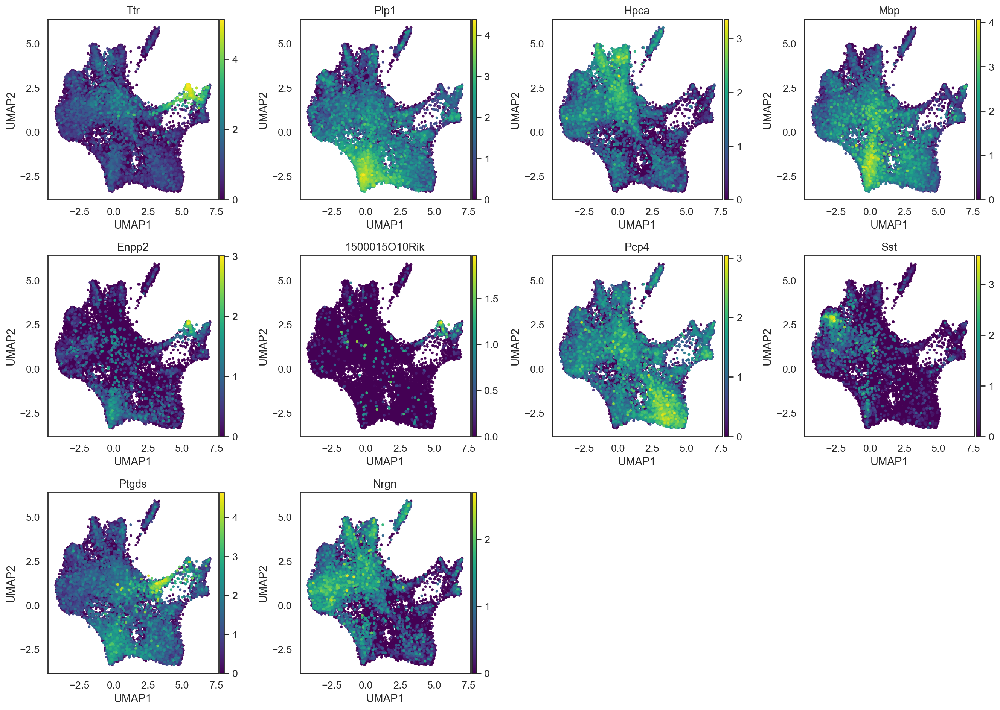

In [172]:
adata.obsm['X_umap'] = adata_C[adata.obs_names,].obsm['X_umap'].copy()
si.pl.umap(adata,
           color=adata.uns["moranI"].head(10).index.tolist(),
           drawing_order='sorted',
           size=5,
           alpha=0.9,
           fig_ncol=4,
           fig_size=(4,4),
           save_fig=False)

# Save data

In [173]:
adata.write(os.path.join(workdir, 'adata.h5ad'))
adata_C.write(os.path.join(workdir, 'adata_C.h5ad'))
adata_G.write(os.path.join(workdir, 'adata_G.h5ad'))
adata_all.write(os.path.join(workdir, 'adata_all.h5ad'))
adata_cmp.write(os.path.join(workdir, 'adata_cmp.h5ad'))